<a href="https://colab.research.google.com/github/AybarsCebi/Crowd-Counting-with-Image-Processing/blob/main/AMRNet50_Draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class CBAMModule(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.channel_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.channel_max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_mlp = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
        )
        self.sigmoid_channel = nn.Sigmoid()
        self.spatial_conv = nn.Sequential(
            nn.Conv2d(2, 8, kernel_size=3, padding=1, bias=False),
            nn.ReLU(),
            nn.Conv2d(8, 1, kernel_size=3, padding=1, bias=False),
        )
        self.sigmoid_spatial = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.channel_avg_pool(x).view(b, c)
        mx  = self.channel_max_pool(x).view(b, c)
        avg_out = self.shared_mlp(avg).view(b, c, 1, 1)
        mx_out  = self.shared_mlp(mx ).view(b, c, 1, 1)
        x = x * self.sigmoid_channel(avg_out + mx_out)

        avg_sp = x.mean(dim=1, keepdim=True)
        mx_sp, _ = x.max(dim=1, keepdim=True)
        x = x * self.sigmoid_spatial(self.spatial_conv(torch.cat([avg_sp, mx_sp], dim=1)))
        return x

class AMRNet_ResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        # Bottleneck blok kullanan ResNet‑50, layer3’te dilation uygulanmış
        resnet = models.resnet50(
            pretrained=True,
            replace_stride_with_dilation=[False, False, True]
        )

        # İlk aşama
        self.initial = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool
        )
        # Scale katmanları
        self.scale1 = resnet.layer1  # 256 kanallı
        self.scale2 = resnet.layer2  # 512 kanallı, ↓8
        self.scale3 = resnet.layer3  # 1024 kanallı, ↓16

        # Attention modüllerini kanal sayılarına göre ayarlayın
        self.att1 = CBAMModule(256)
        self.att2 = CBAMModule(512)
        self.att3 = CBAMModule(1024)

        # Ara supervision head’leri
        self.head1 = nn.Conv2d(256, 1, kernel_size=1)
        self.head2 = nn.Conv2d(512, 1, kernel_size=1)
        self.head3 = nn.Conv2d(1024,1, kernel_size=1)

        # Fuse ve çıkış
        self.fusion_conv = nn.Conv2d(256 + 512 + 1024, 256, kernel_size=1)
        self.density_map = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 64,  kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64,   1,   kernel_size=1),
        )

    def forward(self, x):
        x = self.initial(x)
        x1 = self.att1(self.scale1(x))
        x2 = self.att2(self.scale2(x1))
        x3 = self.att3(self.scale3(x2))

        # Ara supervision haritaları
        d1 = F.interpolate(self.head1(x1), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d2 = F.interpolate(self.head2(x2), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d3 = F.interpolate(self.head3(x3), size=x1.shape[2:], mode='bilinear', align_corners=False)

        # Feature map’leri birleştir
        x2u = F.interpolate(x2, size=x1.shape[2:], mode='bilinear', align_corners=False)
        x3u = F.interpolate(x3, size=x1.shape[2:], mode='bilinear', align_corners=False)
        fused = torch.cat([x1, x2u, x3u], dim=1)
        fused = self.fusion_conv(fused)

        final = self.density_map(fused)
        if self.training:
            return final, (d1, d2, d3)
        return final


In [6]:
import scipy.io
import numpy as np
import cv2
import os

def generate_density_map(img_shape, points, sigma=15):
    """512x512 boyutunda yoğunluk haritası üretir."""
    density_map = np.zeros((512, 512), dtype=np.float32)

    for point in points:
        x, y = min(int(point[0]), 511), min(int(point[1]), 511)
        density_map[y, x] = 1  # Noktayı yerleştir

    density_map = cv2.GaussianBlur(density_map, (0, 0), sigma)
    if density_map.sum() > 0:
        density_map *= (len(points) / density_map.sum())  # Toplam kişi sayısını koru

    return density_map

# Veri seti yolları
data_path = "/content/drive/MyDrive/dataset/train_data/images"
gt_path = "/content/drive/MyDrive/dataset/train_data/ground_truth"
output_dir = "/content/drive/MyDrive/dataset/train_data/density_maps"

os.makedirs(output_dir, exist_ok=True)

for img_file in os.listdir(data_path):
    if not img_file.startswith("IMG_") or not img_file.endswith(".jpg"):
        continue

    img_path = os.path.join(data_path, img_file)

    # Resim ismini ground truth dosyasına uygun hale getir
    img_number = img_file.replace("IMG_", "").replace(".jpg", "")
    gt_path_mat = os.path.join(gt_path, f"GT_IMG_{img_number}.mat")

    if not os.path.exists(gt_path_mat):
        print(f"Uyarı: {gt_path_mat} bulunamadı, atlanıyor.")
        continue

    # Ground truth noktalarını yükle
    mat = scipy.io.loadmat(gt_path_mat)
    points = mat["image_info"][0, 0][0, 0][0]  # (x, y) koordinatları

    # Görüntüyü oku ve 512x512 boyutuna getir
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    img_resized = cv2.resize(img, (512, 512))

    # Koordinatları yeniden ölçeklendir
    points_rescaled = points * [512 / w, 512 / h]

    # Yoğunluk haritası oluştur
    density_map = generate_density_map(img_resized.shape, points_rescaled)

    # .npy olarak kaydet
    npy_path = os.path.join(output_dir, img_file.replace("IMG_", "IMG_").replace(".jpg", ".npy"))
    np.save(npy_path, density_map)


In [3]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

IMG_HEIGHT = 512
IMG_WIDTH = 512

# Eğitim için sadece ColorJitter
train_transform = A.Compose([
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})  # density_map bozulmadan uygulanır

# Validasyon için minimal dönüşüm
val_transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})


In [14]:
class CrowdDataset(Dataset):
    def __init__(self, image_dir, density_dir, transform=None):
        self.image_dir = image_dir
        self.density_dir = density_dir
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        density_path = os.path.join(self.density_dir, self.image_files[idx].replace(".jpg", ".npy"))

        # Görüntüyü oku ve normalize et
        image = cv2.imread(img_path)
        image = cv2.resize(image, (512, 512))
        image = image.astype(np.float32) / 255.0  # Normalize et
        image = np.transpose(image, (2, 0, 1))  # PyTorch için (C, H, W) hale getir

        # Yoğunluk haritasını oku ve normalize et
        density_map = np.load(density_path).astype(np.float32)
        density_map = np.expand_dims(density_map, axis=0)  # (1, H, W) formatına getir

        return torch.tensor(image), torch.tensor(density_map)

# Dataset yolları
train_image_dir = "/content/drive/MyDrive/dataset/train_data/images"
train_density_dir = "/content/drive/MyDrive/dataset/train_data/density_maps"

val_image_dir = "/content/drive/MyDrive/dataset/validation_data/images"
val_density_dir = "/content/drive/MyDrive/dataset/validation_data/density_maps"


test_image_dir = "/content/drive/MyDrive/dataset/test_data/images"
test_density_dir = "/content/drive/MyDrive/dataset/test_data/density_maps"

# DataLoader oluştur
train_dataset = CrowdDataset(train_image_dir, train_density_dir, transform=train_transform)
val_dataset = CrowdDataset(val_image_dir, val_density_dir, transform=val_transform)
test_dataset = CrowdDataset(test_image_dir, test_density_dir)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader   = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

In [7]:
# train_loader'dan bir batch alalım
images, densities = next(iter(train_loader))

print("Images shape:", images.shape)
print("Densities shape:", densities.shape)
print(len(train_loader))  # 0 çıkıyorsa veri gelmiyor!

images, densities = next(iter(train_loader))
print(images.shape, densities.shape)


Images shape: torch.Size([8, 3, 512, 512])
Densities shape: torch.Size([8, 1, 512, 512])
38
torch.Size([8, 3, 512, 512]) torch.Size([8, 1, 512, 512])


In [ ]:
import os

def rename_processed_images(folder_path):
    """
    Belirtilen klasördeki tüm 'processed_IMG_x.jpg' dosyalarını 'IMG_x.jpg' formatına çevirir.

    Args:
        folder_path (str): Resimlerin bulunduğu klasörün yolu.
    """
    for filename in os.listdir(folder_path):
        if filename.startswith("processed_IMG_") and filename.endswith(".jpg"):
            new_name = filename.replace("processed_IMG_", "IMG_")
            old_path = os.path.join(folder_path, filename)
            new_path = os.path.join(folder_path, new_name)
            os.rename(old_path, new_path)
            print(f"Yeniden adlandırıldı: {filename} → {new_name}")

rename_processed_images("/content/drive/MyDrive/dataset/train_data/images")

In [ ]:
'''import torch.nn.functional as F

# Laplacian Loss
def laplacian_loss(pred, target):
    laplace_kernel = torch.tensor([[0, 1, 0],
                                   [1, -4, 1],
                                   [0, 1, 0]], dtype=torch.float32, device=pred.device).unsqueeze(0).unsqueeze(0)
    pred_lap = F.conv2d(pred, laplace_kernel, padding=1)
    target_lap = F.conv2d(target, laplace_kernel, padding=1)
    return F.l1_loss(pred_lap, target_lap)

def count_loss(pred, target):
    pred = pred.clamp(min=0)  # Negatif değerleri önler, ReLu sonrası başka işlem yapılsa bile
    target = target.clamp(min=0)
    pred_count = pred.sum(dim=[1, 2, 3])
    target_count = target.sum(dim=[1, 2, 3])
    return F.l1_loss(pred_count, target_count)

# Total Loss (MSE + CountLoss)
def total_loss(pred, target):
    pred = pred.clamp(min=0) #Negatif deperleri önler, ReLu sonrası başka işlem yapılsa bile
    target = target.clamp(min=0)
    mse = F.mse_loss(pred, target)
    count = count_loss(pred, target)
    weight = torch.log(target.sum(dim=[1, 2, 3]) + 10) / 100  # yoğunluk arttıkça ağırlık artar
    weighted_count = (weight * (pred.sum(dim=[1, 2, 3]) - target.sum(dim=[1, 2, 3])).abs()).mean()
    return mse + 0.4 * weighted_count
    # yüksek yoğunluklu örneklerde sayım hatasına daha fazla ceza verir.'''

'''

import torch
import torch.nn.functional as F

def combined_loss(pred_density, gt_density, alpha=0.01):
    """
    Kombine loss fonksiyonu:
    - pred_density: Modelin tahmin ettiği yoğunluk haritası (tensor)
    - gt_density: Gerçek (ground truth) yoğunluk haritası (tensor)
    - alpha: Global (toplam) sayıya ilişkin loss'un ağırlık katsayısı.

    Bu fonksiyon iki bileşenden oluşur:
    1. Piksel bazlı MSE loss: Her pikseldeki hata kare farkı.
    2. Toplam sayı (count) loss: Tahmin edilen toplam kişi sayısı ile gerçeğin L1 farkı.
    """
    # Piksel bazında ortalama kare hatayı hesapla
    pixel_loss = F.mse_loss(pred_density, gt_density)

    # Toplam kişi sayısı farkı, L1 loss olarak hesaplanıyor
    count_loss = torch.abs(pred_density.sum() - gt_density.sum())

    total_loss = pixel_loss + alpha * count_loss
    return total_loss

'''



import torch
import torch.nn.functional as F

def improved_loss(pred, gt, alpha=1e-4, beta=0.1):
    """
    pred: [B,1,H,W] tahmin haritası
    gt:   [B,1,H,W] gerçek harita
    alpha: count-loss ağırlığı
    beta: gradient-loss ağırlığı
    """
    # 1) Pixel-level: Smooth L1
    pixel_loss = F.smooth_l1_loss(pred, gt)

    # 2) Global count: L1
    pred_count = pred.sum(dim=[1,2,3])
    true_count = gt.sum(dim=[1,2,3])
    count_loss = F.l1_loss(pred_count, true_count)

    # 3) Gradient loss (sobel yerine basit fark)
    def grads(x):
        gx = x[:, :, 1:, :] - x[:, :, :-1, :]
        gy = x[:, :, :, 1:] - x[:, :, :, :-1]
        return gx, gy

    pgx, pgy = grads(pred)
    ggx, ggy = grads(gt)
    grad_loss = F.l1_loss(pgx, ggx) + F.l1_loss(pgy, ggy)

    return pixel_loss \
           + alpha * count_loss \
           + beta  * grad_loss




In [8]:
def evaluate_model(model, test_loader, device):
    model.eval()
    model.to(device)

    mae = 0.0
    mse = 0.0

    with torch.no_grad():
        for images, densities in test_loader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                # Toplam kişi sayısı tahmini
                gt_count = gt_density.sum()
                pred_count = pred_density.sum()
                print("MAE: ", abs(pred_count - gt_count).item())
                mae += abs(pred_count - gt_count).item()
                mse += ((pred_count - gt_count)**2).item()

    num_samples = len(test_loader.dataset)
    mae /= num_samples
    mse /= num_samples

    return mae, mse



In [ ]:
import copy

def grid_search_and_train(
    model_cls,
    train_loader,
    val_loader,
    test_loader,
    device,
    optimizer_fn,
    alphas,
    aux_weights,
    epochs=50,
    patience=10,
    lr=1e-5,
    weight_decay=1e-4
):
    """
    1) alphas × aux_weights kombinasyonlarıyla kısa bir eğitim yapar (örneğin 5 epoch)
    2) Her bir kombinasyon için validasyon MAE'sini ölçer
    3) En iyi komboyu bulur, baştan modeli o kombinasyonla  tam epochs boyunca eğitir
    4) En son test MAE'sini de bastırır
    """
    best_combo = None
    best_mae = float('inf')

    # 1. hızlı tarama (early epochs sayısını small_epochs ile sınırla)
    small_epochs = 5
    for alpha in alphas:
        for aux in aux_weights:
            # her kombinasyon için taze bir model oluştur
            model = model_cls().to(device)
            optimizer = optimizer_fn(model.parameters(), lr=lr, weight_decay=weight_decay)

            # kısa eğitim
            _, _, val_maes, _ = train_model(
                model, train_loader, val_loader, None, optimizer, scheduler, device,
                epochs=small_epochs,
                patience=small_epochs,  # hemen durdursun
                aux_weight=aux,
                alpha=alpha
            )

            mean_val_mae = sum(val_maes) / len(val_maes)
            print(f"[Grid] α={alpha:.0e}, aux={aux:.2f} → mean-val-MAE={mean_val_mae:.2f}")

            if mean_val_mae < best_mae:
                best_mae = mean_val_mae
                best_combo = (alpha, aux)

    print(f"\n==> En iyi kombinasyon: alpha={best_combo[0]:.0e}, aux_weight={best_combo[1]:.2f}  (mean-val-MAE={best_mae:.2f})\n")



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_cls = AMRNet_ResNet50
optimizer_fn = torch.optim.AdamW

alphas = [1e-5, 5e-5, 1e-4, 5e-4]
aux_weights = [0.1, 0.2, 0.3]


best_combo, train_losses, val_losses, val_maes, val_mses = grid_search_and_train(
    model_cls,
    train_loader,
    val_loader,
    test_loader,
    device,
    optimizer_fn,
    alphas,
    aux_weights,
    epochs=80,
    patience=20,
    lr=1e-5,
    weight_decay=1e-4
)

print("Grid search sonucu en iyi hyperparametreler:", best_combo)

TypeError: train_model() got multiple values for argument 'epochs'

In [9]:
train_losses = []
val_losses = []
val_maes = []
val_mses = []

from torch.optim.lr_scheduler import ReduceLROnPlateau

def train_model(model, train_loader, val_loader, optimizer, device, epochs=80, patience=10, aux_weight=0.2):
    best_val_loss = float('inf')
    patience_counter = 0
    criterion = nn.MSELoss()

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, densities in train_loader:
            images    = images.to(device)
            densities = densities.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            if isinstance(outputs, tuple):
                final, (d1, d2, d3) = outputs
            else:
                final = outputs
                d1 = d2 = d3 = None

            if final.shape[-2:] != densities.shape[-2:]:
                final = F.interpolate(final, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            loss_main = criterion(final, densities)

            loss_aux = 0
            if d1 is not None:
                for d in (d1, d2, d3):
                    d = F.interpolate(d, size=densities.shape[-2:], mode='bilinear', align_corners=False)
                    loss_aux += criterion(d, densities)

            total_loss = loss_main + aux_weight * loss_aux
            total_loss.backward()
            optimizer.step()
            train_loss += total_loss.item()

        # Validation
        model.eval()
        val_loss = 0
        val_mae = 0
        val_mse = 0

        with torch.no_grad():
            for images, densities in val_loader:
                images    = images.to(device)
                densities = densities.to(device)

                outputs = model(images)
                if isinstance(outputs, tuple):
                    outputs, _ = outputs

                if outputs.shape[-2:] != densities.shape[-2:]:
                    outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

                loss = criterion(outputs, densities)
                val_loss += loss.item()

                pred_counts = outputs.sum(dim=[1, 2, 3])
                true_counts = densities.sum(dim=[1, 2, 3])
                val_mae += torch.abs(pred_counts - true_counts).sum().item()
                val_mse += ((pred_counts - true_counts) ** 2).sum().item()

        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss   = val_loss   / len(val_loader)
        avg_val_mae    = val_mae    / len(val_loader.dataset)
        avg_val_mse    = val_mse    / len(val_loader.dataset)

        print(f"Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {avg_train_loss:.4f} | "
              f"Val Loss: {avg_val_loss:.4f} | "
              f"Val MAE: {avg_val_mae:.2f} | "
              f"Val MSE: {avg_val_mse:.2f}")

        if avg_val_loss <= best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            torch.save(model.state_dict(), "best_model.pt")
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered at epoch {epoch+1}.")
                break

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        val_maes.append(avg_val_mae)
        val_mses.append(avg_val_mse)

    return train_losses, val_losses, val_maes, val_mses


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AMRNet_ResNet50().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)

train_model(model, train_loader, val_loader, optimizer, device, epochs=80, patience=20, aux_weight=0.2)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 167MB/s]


Epoch 1/80 | Train Loss: 0.0024 | Val Loss: 0.0004 | Val MAE: 5150.98 | Val MSE: 27001803.33
Epoch 2/80 | Train Loss: 0.0005 | Val Loss: 0.0000 | Val MAE: 553.66 | Val MSE: 408857.00
Epoch 3/80 | Train Loss: 0.0002 | Val Loss: 0.0000 | Val MAE: 292.28 | Val MSE: 222155.41
Epoch 4/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 266.90 | Val MSE: 147757.85
Epoch 5/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 243.71 | Val MSE: 119138.03
Epoch 6/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 228.25 | Val MSE: 108335.32
Epoch 7/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 219.76 | Val MSE: 96325.30
Epoch 8/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 210.53 | Val MSE: 78356.68
Epoch 9/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 213.48 | Val MSE: 93188.94
Epoch 10/80 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 234.90 | Val MSE: 104442.61
Epoch 11/80 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 198.60 | Val MSE: 85898.58
Epoch 12/

([0.0023641895937831386,
  0.00048860168700278,
  0.0002273138153740499,
  0.00013327005274875678,
  9.433804217750501e-05,
  7.664228657009325e-05,
  6.830677509577454e-05,
  6.192829833277134e-05,
  5.677439472301079e-05,
  5.21592844865824e-05,
  4.852685263980866e-05,
  4.609471177804823e-05,
  4.3089880675420556e-05,
  4.082206166793568e-05,
  3.9683621300929717e-05,
  3.7222404659443876e-05,
  3.606545435200372e-05,
  3.43661475581987e-05,
  3.239471138122577e-05,
  3.200672601547252e-05,
  3.0119340169078084e-05,
  2.9386024739084716e-05,
  2.9058590945695822e-05,
  2.7547023005593618e-05,
  2.6765487841897228e-05,
  2.6139638210129067e-05,
  2.5256304884111925e-05,
  2.5069414493229585e-05,
  2.425230631113089e-05,
  2.3665622153968895e-05,
  2.3278283821893735e-05,
  2.3264250222909094e-05,
  2.1527054502114067e-05,
  2.148133113989484e-05,
  2.1442079167555723e-05,
  2.0947810825370988e-05,
  2.0033356361780437e-05,
  1.9721817998767e-05,
  1.9285995892316448e-05,
  1.9308019

In [10]:
test_mae, test_mse = evaluate_model(model, test_loader, device)
print(f"Test MAE: {test_mae:.2f} | Test MSE: {test_mse:.2f}")

MAE:  151.584716796875
MAE:  97.89144897460938
MAE:  10.794815063476562
MAE:  8.26971435546875
MAE:  72.428955078125
MAE:  267.6943359375
MAE:  99.7198486328125
MAE:  156.1243896484375
MAE:  53.65582275390625
MAE:  114.407470703125
MAE:  4.39300537109375
MAE:  155.87948608398438
MAE:  76.40252685546875
MAE:  73.77339172363281
MAE:  48.74815368652344
MAE:  59.61529541015625
MAE:  154.485107421875
MAE:  46.82494354248047
MAE:  98.54067993164062
MAE:  127.43283081054688
MAE:  13.094131469726562
MAE:  79.77529907226562
MAE:  54.63087463378906
MAE:  463.5760498046875
MAE:  12.977645874023438
MAE:  103.9310302734375
MAE:  29.4815673828125
MAE:  28.79461669921875
MAE:  264.1572265625
MAE:  300.23065185546875
MAE:  162.59934997558594
MAE:  187.27175903320312
MAE:  446.95452880859375
MAE:  82.63880920410156
MAE:  20.2744140625
MAE:  29.85968017578125
MAE:  114.49774169921875
MAE:  71.87654113769531
MAE:  6.1811065673828125
MAE:  13.27276611328125
MAE:  44.571044921875
MAE:  180.91693115234375
M

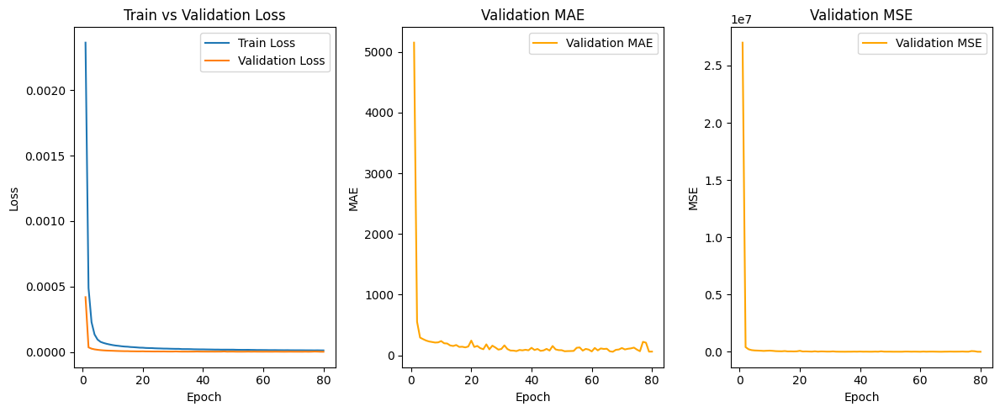

In [11]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses)+1)

plt.figure(figsize=(12, 5))

# Loss Grafiği
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label="Train Loss")
plt.plot(epochs_range, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss")
plt.legend()

# MAE Grafiği
plt.subplot(1, 3, 2)
plt.plot(epochs_range, val_maes, label="Validation MAE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Validation MAE")
plt.legend()

# MSE Grafiği
plt.subplot(1, 3, 3)
plt.plot(epochs_range, val_mses, label="Validation MSE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Validation MSE")
plt.legend()

plt.tight_layout()
plt.show()


In [27]:
import numpy as np

MEAN = np.array([0.485, 0.456, 0.406])
STD  = np.array([0.229, 0.224, 0.225])

def denormalize(img_tensor):
    # img_tensor: torch.Tensor [3,H,W], normalize edilmiş
    img = img_tensor.cpu().numpy().transpose(1,2,0)   # → H,W,3
    img = (img * STD) + MEAN                         # normalize'i ters çevir
    return np.clip(img, 0, 1)


Tahmini kişi sayısı: 1742.95


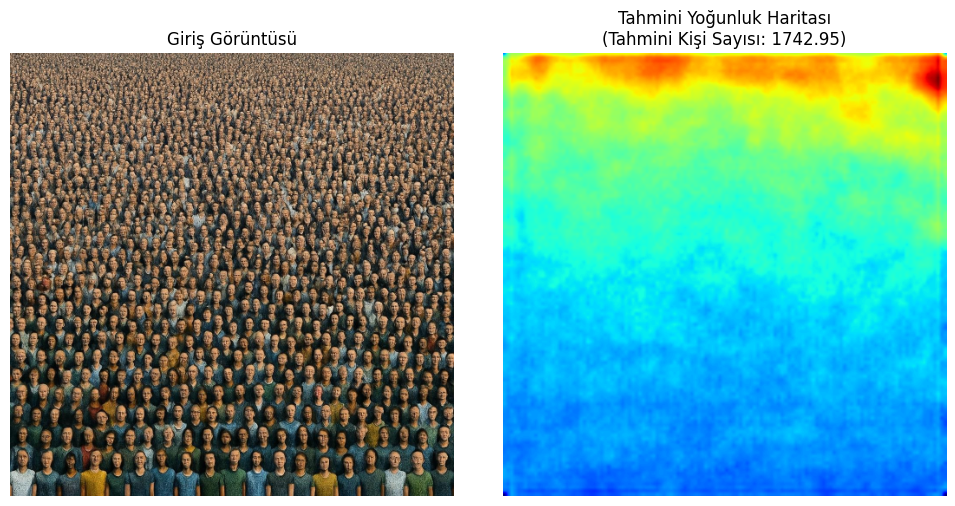

In [32]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F

def test_single_image(model, image_path, device):
    # Görüntüyü oku
    image = cv2.imread(image_path)
    image = cv2.resize(image, (512, 512))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Görselleştirme için

    # Normalize et ve tensor formatına getir
    image_tensor = image.astype(np.float32) / 255.0
    image_tensor = np.transpose(image_tensor, (2, 0, 1))  # (C, H, W)
    image_tensor = torch.tensor(image_tensor).unsqueeze(0).to(device)  # (1, C, H, W)

    # Model ile tahmin et
    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        output = F.interpolate(output, size=(512, 512), mode='bilinear', align_corners=False)
        density_map = output.squeeze().cpu().numpy()

    # Kişi sayısını yazdır
    count = density_map.sum()
    print(f"Tahmini kişi sayısı: {count:.2f}")

    # Görüntü ve yoğunluk haritasını göster
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Giriş Görüntüsü")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(density_map, cmap='jet')
    plt.title(f"Tahmini Yoğunluk Haritası\n(Tahmini Kişi Sayısı: {count:.2f})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


image_path = "/content/WhatsApp Image 2025-05-04 at 00.20.41.jpeg"
test_single_image(model, image_path, device)

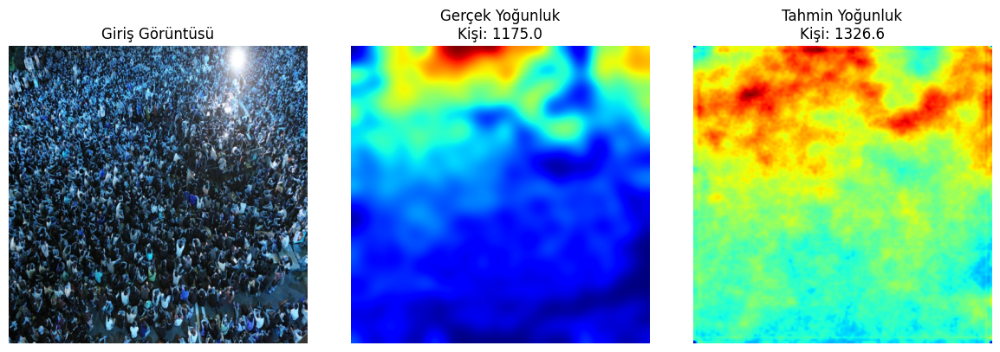

Difference:  -151.58472


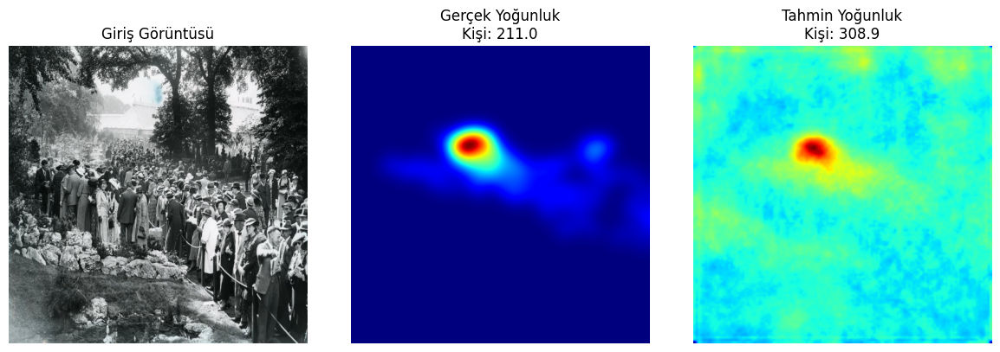

Difference:  -97.89145


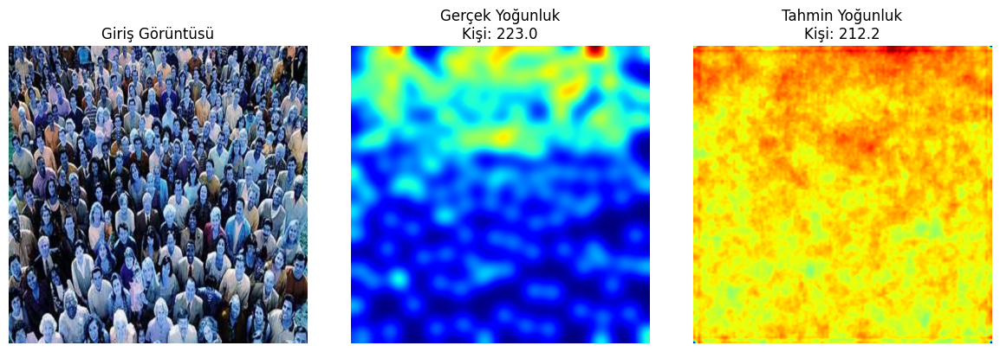

Difference:  10.794815


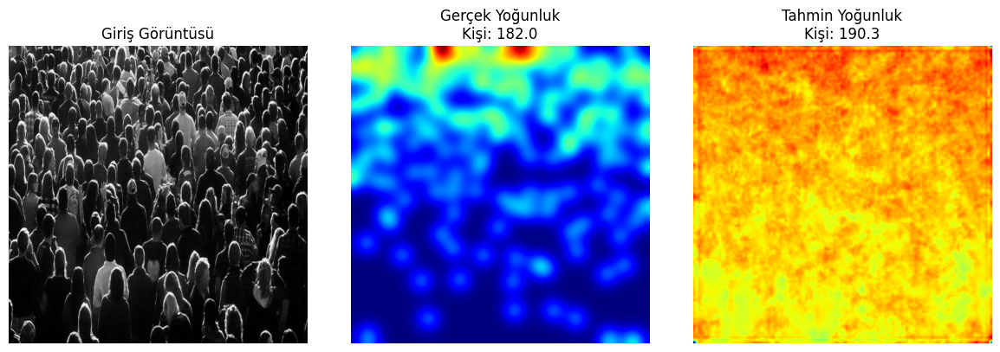

Difference:  -8.269714


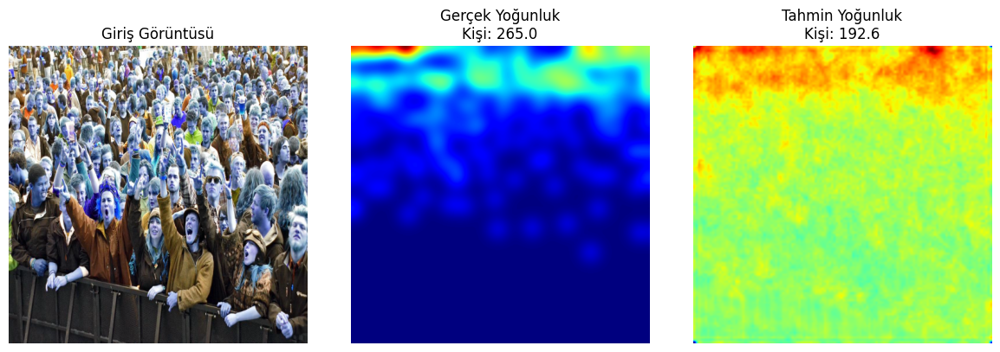

Difference:  72.428955


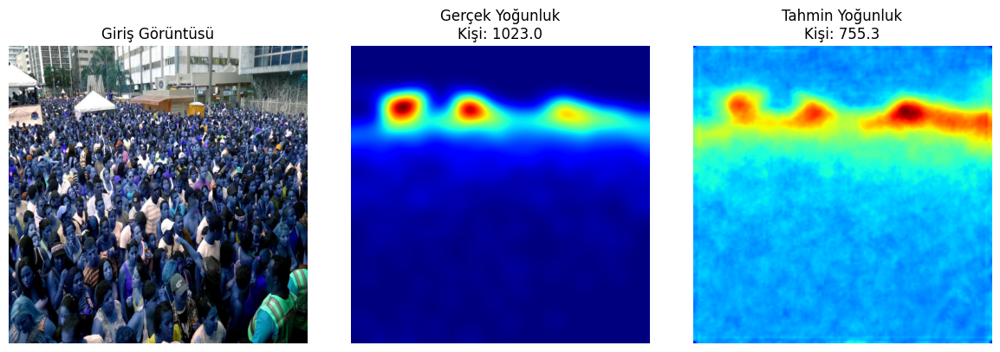

Difference:  267.69434


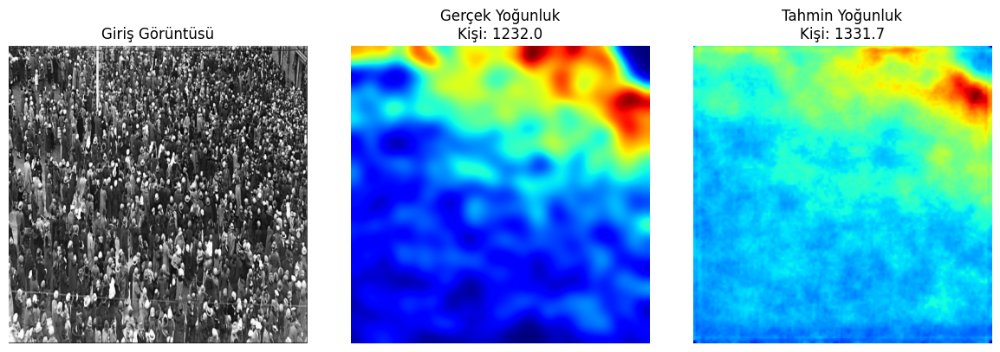

Difference:  -99.71985


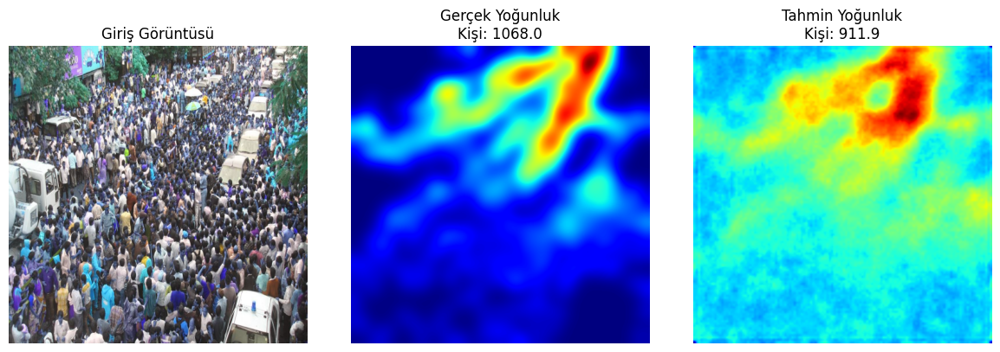

Difference:  156.12439


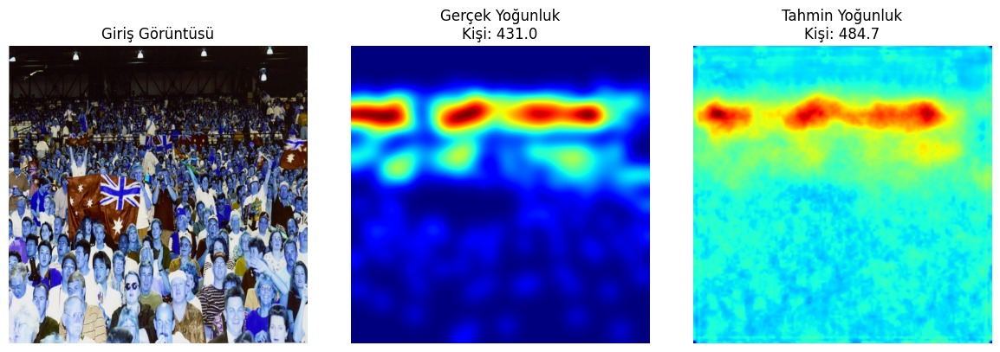

Difference:  -53.655823


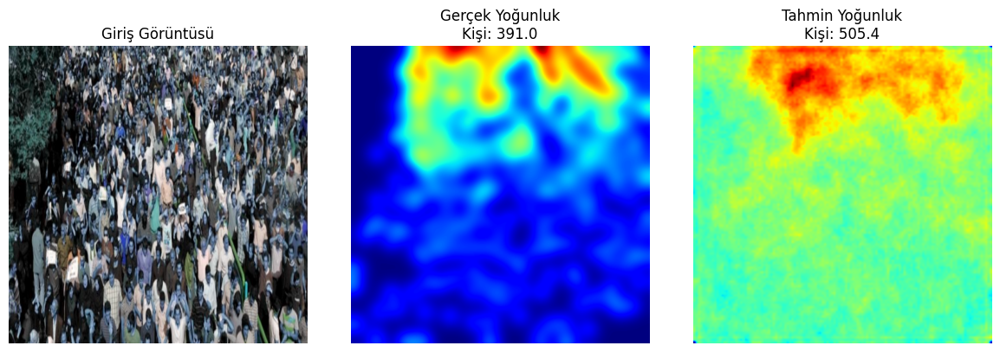

Difference:  -114.40747


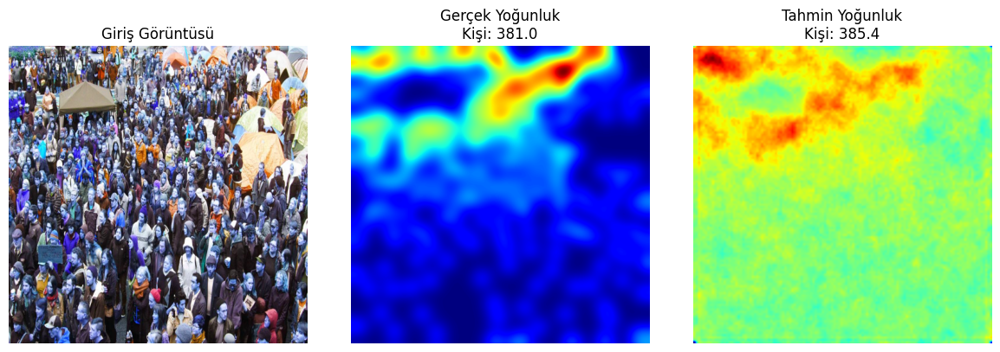

Difference:  -4.3930054


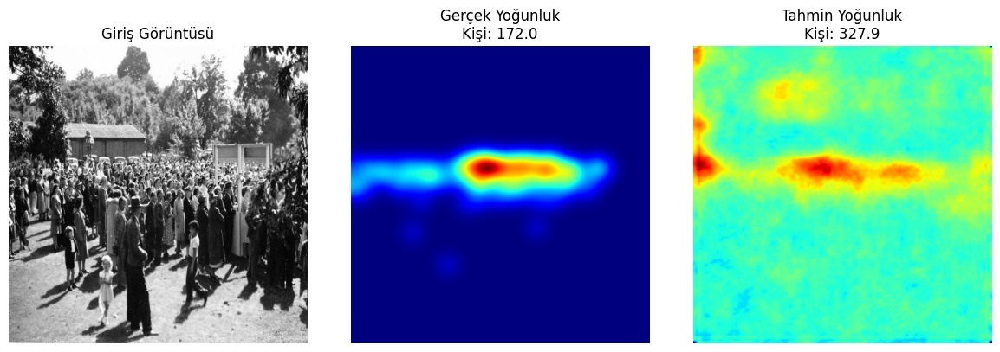

Difference:  -155.87949


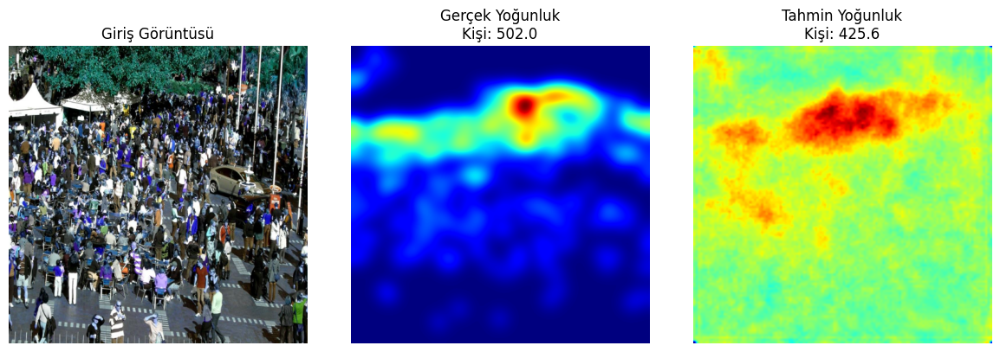

Difference:  76.40253


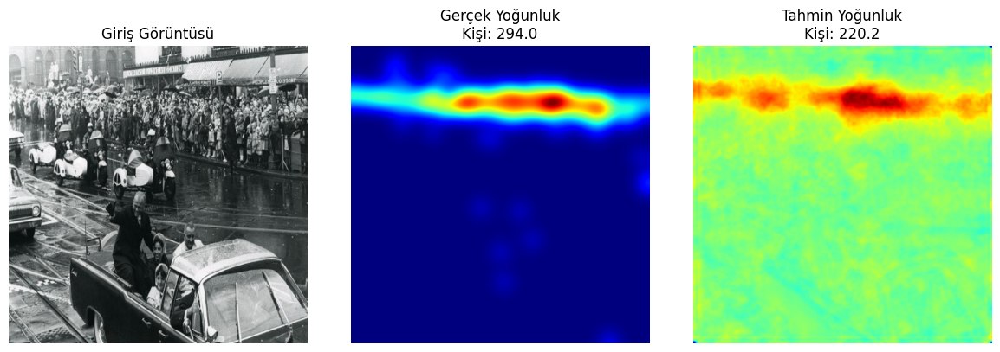

Difference:  73.77339


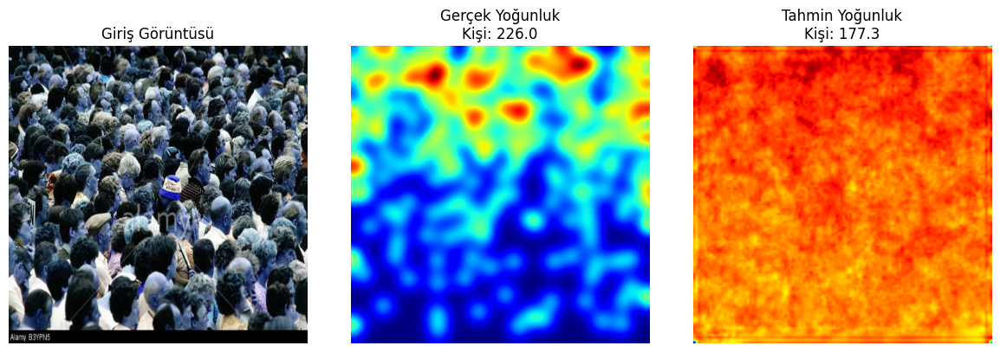

Difference:  48.748154


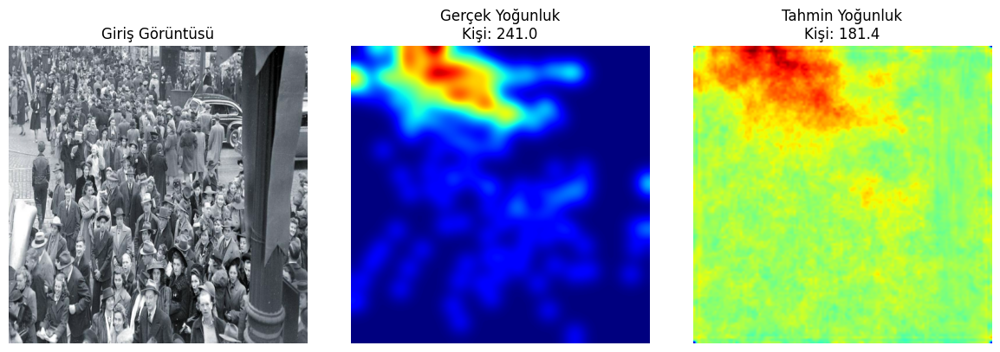

Difference:  59.615295


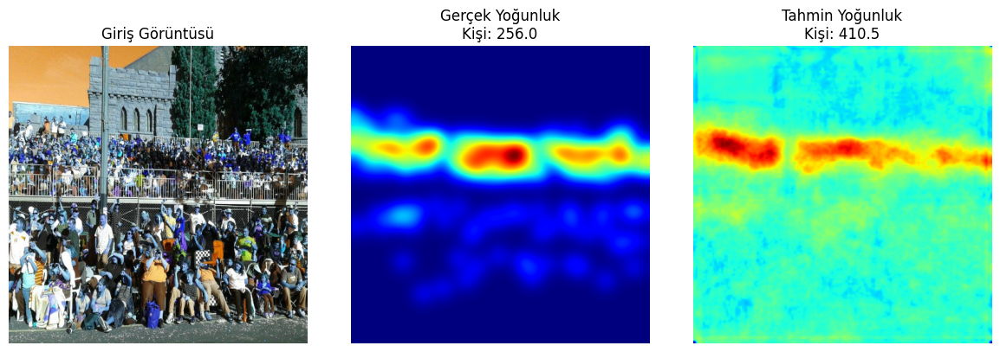

Difference:  -154.4851


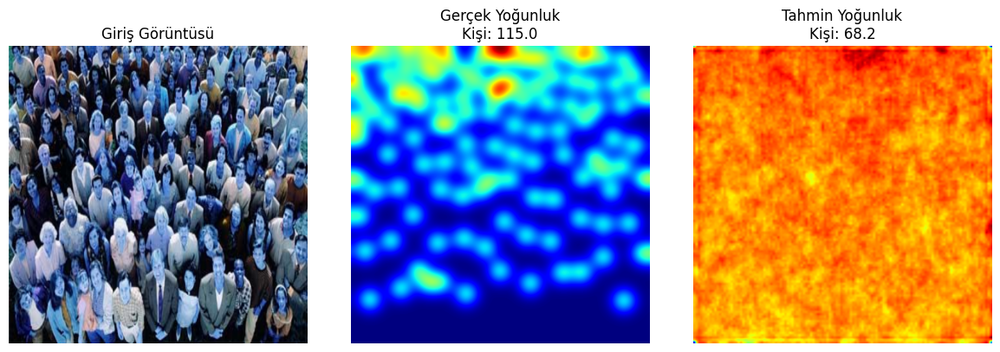

Difference:  46.824944


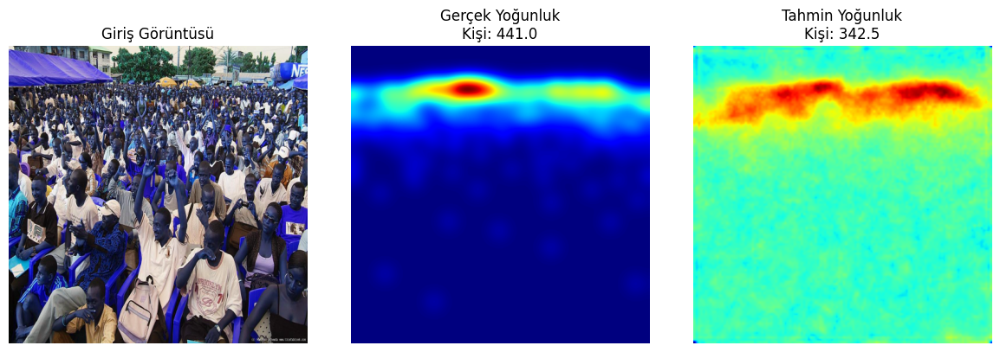

Difference:  98.54068


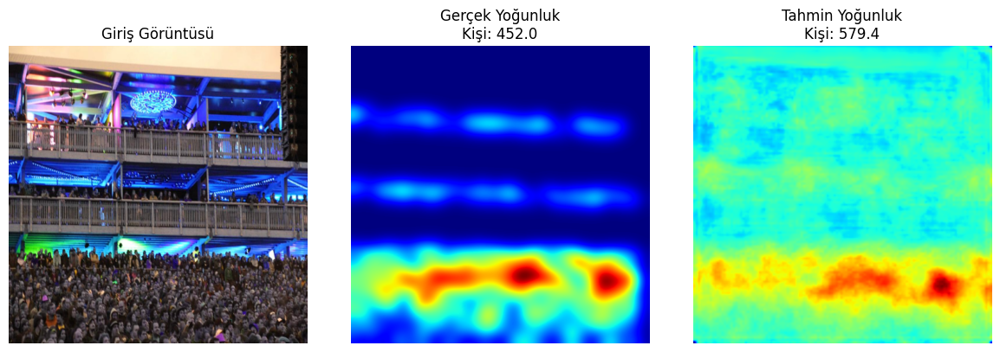

Difference:  -127.43283


In [30]:
import torchvision.transforms.functional as TF

def visualize_predictions(model, dataloader, device, num_samples=5):
    model.eval()
    count = 0

    with torch.no_grad():
        for images, densities in dataloader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                # Toplam kişi sayısı tahmini
                gt_count = gt_density.sum()
                pred_count = pred_density.sum()

                # Görselleştir
                fig, axs = plt.subplots(1, 3, figsize=(12, 4))

                axs[0].imshow(TF.to_pil_image(img))
                axs[0].set_title("Giriş Görüntüsü")
                axs[0].axis("off")

                axs[1].imshow(gt_density, cmap='jet')
                axs[1].set_title(f"Gerçek Yoğunluk\nKişi: {gt_count:.1f}")
                axs[1].axis("off")

                axs[2].imshow(pred_density, cmap='jet')
                axs[2].set_title(f"Tahmin Yoğunluk\nKişi: {pred_count:.1f}")
                axs[2].axis("off")

                plt.tight_layout()
                plt.show()
                print("Difference: ",gt_count-pred_count)
                count += 1
                if count >= num_samples:
                    return  # Belirtilen kadar örnek göster


# Model tahminlerini görselleştir
visualize_predictions(model, test_loader, device, num_samples=20)